# Imports

In [1]:
# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES,
# THEN FEEL FREE TO DELETE THIS CELL.
# NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# NOTEBOOK.
import kagglehub
pkdarabi_cardetection_path = kagglehub.dataset_download('pkdarabi/cardetection')

print('Data source import complete.')


Data source import complete.


In [2]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 28.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 112.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 89.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 57.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 13.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 9.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 65.6 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling

In [3]:
import ultralytics
ultralytics.checks()

Ultralytics 8.3.141 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 41.3/112.6 GB disk)


In [4]:
!nvidia-smi

Wed May 21 16:08:42 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   40C    P8              9W /   70W |       2MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [5]:
import os
import random
import pandas as pd
from PIL import Image
import cv2
from ultralytics import YOLO
from IPython.display import Video
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style='darkgrid')
import pathlib
import glob
from tqdm.notebook import trange, tqdm
import warnings
warnings.filterwarnings('ignore')

In [6]:
sns.set(rc={'axes.facecolor': '#eae8fa'}, style='darkgrid')

# Sample images from dataset

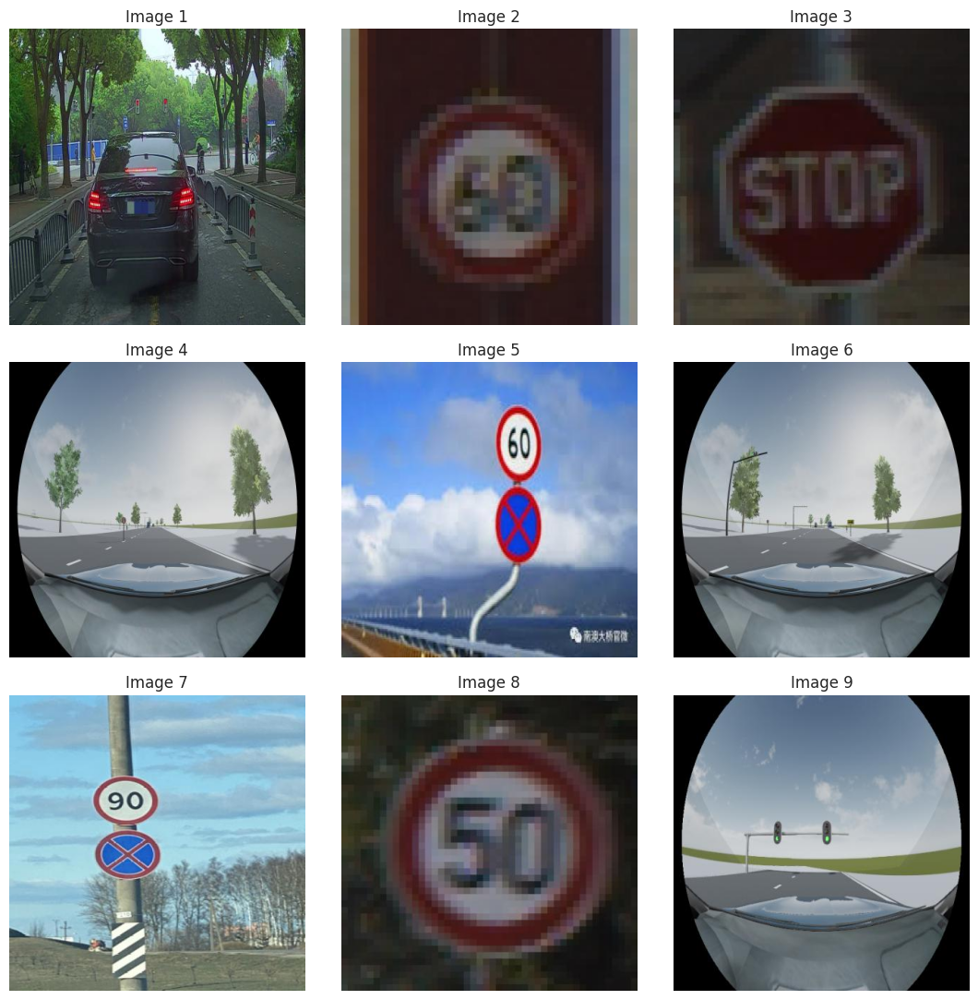

In [7]:
Image_dir = '/kaggle/input/cardetection/car/train/images'

num_samples = 9
image_files = os.listdir(Image_dir)

# Randomly select num_samples images
rand_images = random.sample(image_files, num_samples)

fig, axes = plt.subplots(3, 3, figsize=(11, 11))

for i in range(num_samples):
    image = rand_images[i]
    ax = axes[i // 3, i % 3]
    ax.imshow(plt.imread(os.path.join(Image_dir, image)))
    ax.set_title(f'Image {i+1}')
    ax.axis('off')

plt.tight_layout()
plt.show()

In [8]:
image = cv2.imread("/kaggle/input/cardetection/car/train/images/00000_00000_00012_png.rf.23f94508dba03ef2f8bd187da2ec9c26.jpg")
h, w, c = image.shape
print(f"The image has dimensions {w}x{h} and {c} channels.")

The image has dimensions 416x416 and 3 channels.


# Stop sign detection - normal model

100%|██████████| 21.5M/21.5M [00:00<00:00, 176MB/s]



image 1/1 /kaggle/input/cardetection/car/train/images/FisheyeCamera_1_00228_png.rf.e7c43ee9b922f7b2327b8a00ccf46a4c.jpg: 640x640 1 stop sign, 16.5ms
Speed: 16.0ms preprocess, 16.5ms inference, 355.8ms postprocess per image at shape (1, 3, 640, 640)


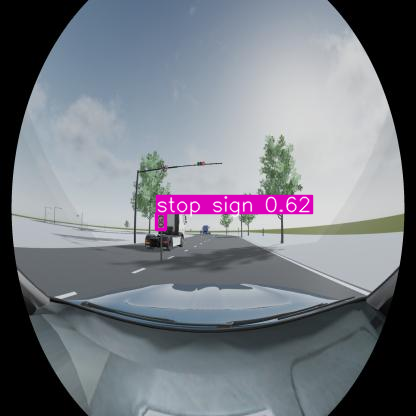

In [9]:
#model = YOLO("yolov8n.pt")
model = YOLO("yolov8s.pt")
#model = YOLO("yolov8m.pt")

# Use the model to detect object
image = "/kaggle/input/cardetection/car/train/images/FisheyeCamera_1_00228_png.rf.e7c43ee9b922f7b2327b8a00ccf46a4c.jpg"
result_predict = model.predict(source = image, imgsz=(640))

# show results
plot = result_predict[0].plot()
plot = cv2.cvtColor(plot, cv2.COLOR_BGR2RGB)
display(Image.fromarray(plot))

In [10]:
!pip install --upgrade ultralytics ray

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 68.5/68.5 MB 11.7 MB/s eta 0:00:00


# Augmentation and training

In [11]:
from ultralytics import YOLO
from ultralytics.data.augment import Albumentations
import albumentations as A
import numpy as np

# Custom augmentation pipeline
class CustomAlbumentations(Albumentations):
    def __init__(self):
        self.transform = A.Compose([
            # Blurring effects
            A.OneOf([
                A.Blur(blur_limit=(1, 3), p=0.5),           # Gaussian blur
                A.MotionBlur(blur_limit=(3, 7), p=0.5),     # Motion blur
                A.MedianBlur(blur_limit=3, p=0.5)          # Median blur
            ], p=0.5),

            # Color and spatial augmentations
            A.HueSaturationValue(hue_shift_limit=0.015,
                               sat_shift_limit=0.7,
                               val_shift_limit=0.4, p=0.5),
            A.Rotate(limit=10, p=0.5),
            A.RandomBrightnessContrast(p=0.5),
            A.HorizontalFlip(p=0.5),
            A.VerticalFlip(p=0.5),
        ], bbox_params=A.BboxParams(format='yolo',
                                  label_fields=['class_labels']))

# Load the model
Final_model = YOLO('yolov8s.pt')

# Override default augmentations
Final_model.augment = CustomAlbumentations()

# Training configuration
Result_Final_model = Final_model.train(
    data="/kaggle/input/cardetection/car/data.yaml",
    epochs=10,
    batch=-1,
    optimizer='auto',
    augment=True  # Enable augmentations
)

Ultralytics 8.3.141 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=True, auto_augment=randaugment, batch=-1, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/input/cardetection/car/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=10, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8s.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=12.0,

100%|██████████| 755k/755k [00:00<00:00, 24.8MB/s]


Overriding model.yaml nc=80 with nc=15

                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     29056  ultralytics.nn.modules.block.C2f             [64, 64, 1, True]             
  3                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  4                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  5                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
  6                  -1  2    788480  ultralytics.nn.modules.block.C2f             [256, 256, 2, True]           
  7                  -1  1   1180672  ultralytic

100%|██████████| 5.35M/5.35M [00:00<00:00, 104MB/s]


AMP: checks passed ✅
train: Fast image access ✅ (ping: 0.0±0.0 ms, read: 4.7±2.7 MB/s, size: 24.1 KB)


train: Scanning /kaggle/input/cardetection/car/train/labels... 3530 images, 3 backgrounds, 0 corrupt: 100%|██████████| 3530/3530 [00:29<00:00, 119.49it/s]


WARNING ⚠️ train: Cache directory /kaggle/input/cardetection/car/train is not writeable, cache not saved.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
AutoBatch: Computing optimal batch size for imgsz=640 at 60.0% CUDA memory utilization.
AutoBatch: CUDA:0 (Tesla T4) 14.74G total, 0.18G reserved, 0.17G allocated, 14.40G free
      Params      GFLOPs  GPU_mem (GB)  forward (ms) backward (ms)                   input                  output
    11141405       28.68         0.919         39.08         245.2        (1, 3, 640, 640)                    list
    11141405       57.35         1.214         24.09         88.97        (2, 3, 640, 640)                    list
    11141405       114.7         1.713         31.02         87.61        (4, 3, 640, 640)                    list
    11141405       229.4         2.699      

train: Scanning /kaggle/input/cardetection/car/train/labels... 3530 images, 3 backgrounds, 0 corrupt: 100%|██████████| 3530/3530 [00:05<00:00, 606.52it/s]

WARNING ⚠️ train: Cache directory /kaggle/input/cardetection/car/train is not writeable, cache not saved.


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 4.7±2.4 MB/s, size: 19.9 KB)


val: Scanning /kaggle/input/cardetection/car/valid/labels... 801 images, 0 backgrounds, 0 corrupt: 100%|██████████| 801/801 [00:06<00:00, 119.10it/s]


WARNING ⚠️ val: Cache directory /kaggle/input/cardetection/car/valid is not writeable, cache not saved.
Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000526, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10      6.81G     0.9215      6.312      1.242         15        640: 100%|██████████| 111/111 [01:08<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:09<00:00,  1.42it/s]

                   all        801        944      0.339      0.506      0.355       0.28



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10      6.84G     0.7228        1.8      1.059         14        640: 100%|██████████| 111/111 [01:03<00:00,  1.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:08<00:00,  1.60it/s]

                   all        801        944      0.647      0.624      0.631      0.509



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      7.21G     0.7154      1.246      1.052         12        640: 100%|██████████| 111/111 [01:03<00:00,  1.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:07<00:00,  1.74it/s]

                   all        801        944      0.628      0.633      0.689      0.563



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      6.83G     0.6925      1.043      1.031         12        640: 100%|██████████| 111/111 [01:03<00:00,  1.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:08<00:00,  1.57it/s]

                   all        801        944       0.79      0.668      0.781      0.649



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      7.21G     0.6575     0.8362      1.013         12        640: 100%|██████████| 111/111 [01:02<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:08<00:00,  1.57it/s]

                   all        801        944       0.86      0.736      0.839      0.695



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10      6.83G     0.6349     0.7095      1.004         12        640: 100%|██████████| 111/111 [01:02<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:07<00:00,  1.67it/s]

                   all        801        944      0.916      0.813      0.905      0.759



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      7.21G     0.6084     0.6082     0.9833         14        640: 100%|██████████| 111/111 [01:02<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:08<00:00,  1.54it/s]

                   all        801        944      0.938      0.815      0.919      0.775



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      6.83G       0.59      0.533      0.964         11        640: 100%|██████████| 111/111 [01:03<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:07<00:00,  1.64it/s]

                   all        801        944      0.924      0.867      0.934      0.799



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10       7.2G     0.5679     0.4699     0.9528         18        640: 100%|██████████| 111/111 [01:02<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:08<00:00,  1.61it/s]

                   all        801        944      0.952      0.852      0.951      0.811



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      6.83G     0.5429     0.4225     0.9409         10        640: 100%|██████████| 111/111 [01:03<00:00,  1.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:08<00:00,  1.59it/s]

                   all        801        944      0.943      0.887      0.957       0.82



10 epochs completed in 0.203 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 22.5MB
Optimizer stripped from runs/detect/train/weights/best.pt, 22.5MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.141 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 11,131,389 parameters, 0 gradients, 28.5 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:16<00:00,  1.23s/it]


                   all        801        944      0.929      0.889      0.952      0.815
           Green Light         87        122      0.802      0.764      0.841      0.512
             Red Light         74        108      0.867      0.724      0.819      0.486
       Speed Limit 100         52         52      0.874      0.923      0.966      0.862
       Speed Limit 110         17         17      0.893      0.941       0.99      0.916
       Speed Limit 120         60         60      0.938      0.917       0.98      0.895
        Speed Limit 20         56         56      0.993      0.982      0.986      0.854
        Speed Limit 30         71         74      0.897      0.946      0.977      0.902
        Speed Limit 40         53         55      0.951      0.909      0.982      0.882
        Speed Limit 50         68         71      0.956      0.845      0.936      0.838
        Speed Limit 60         76         76      0.951      0.895       0.96      0.857
        Speed Limit 7

# Train results

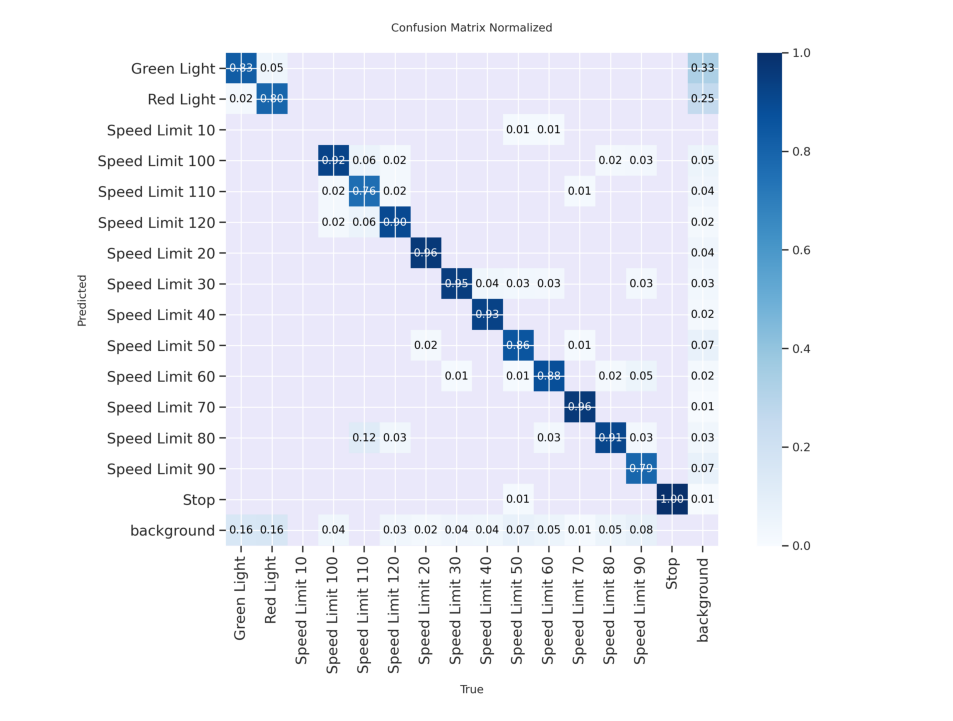

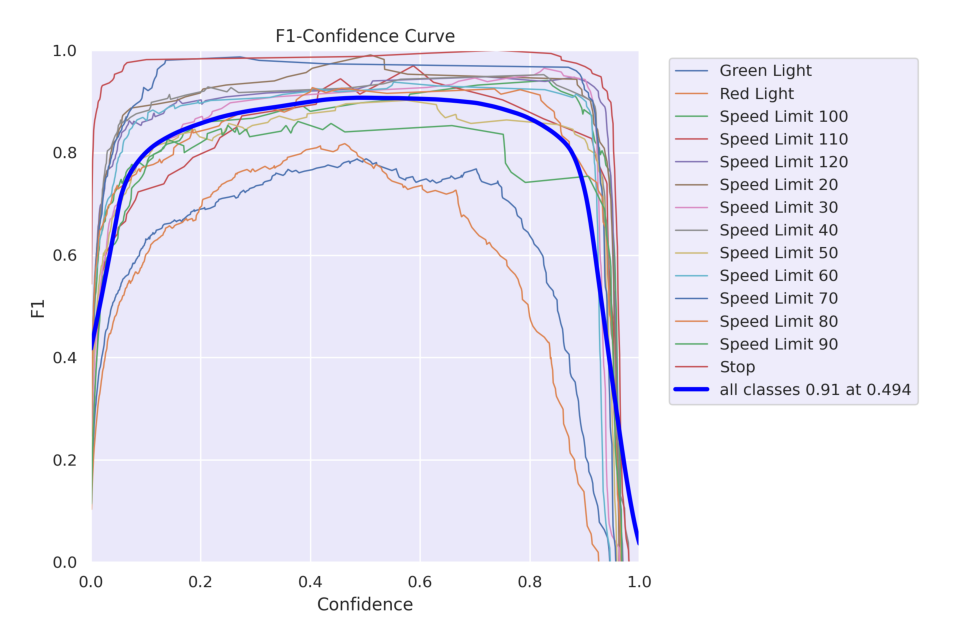

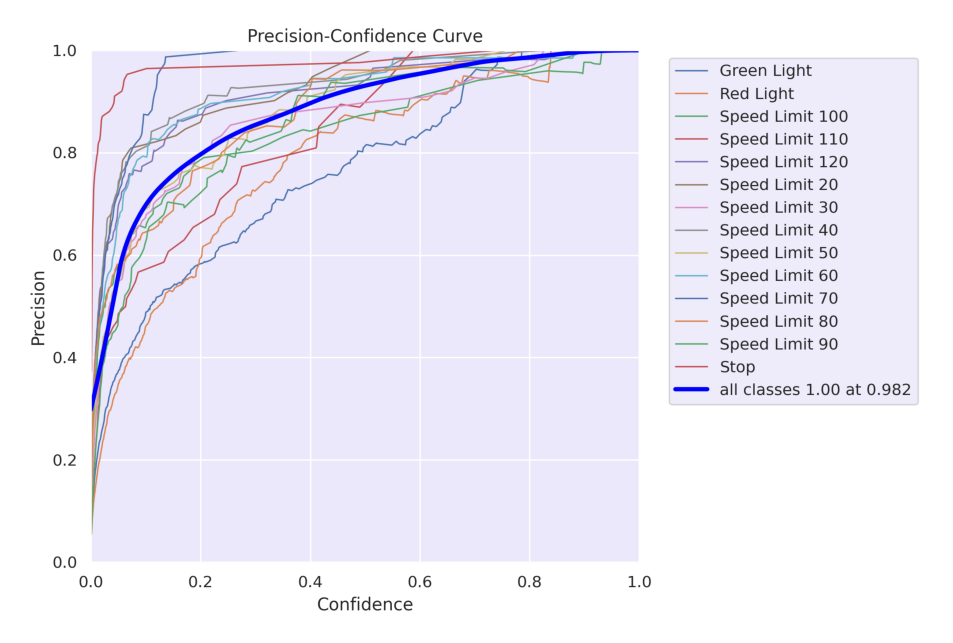

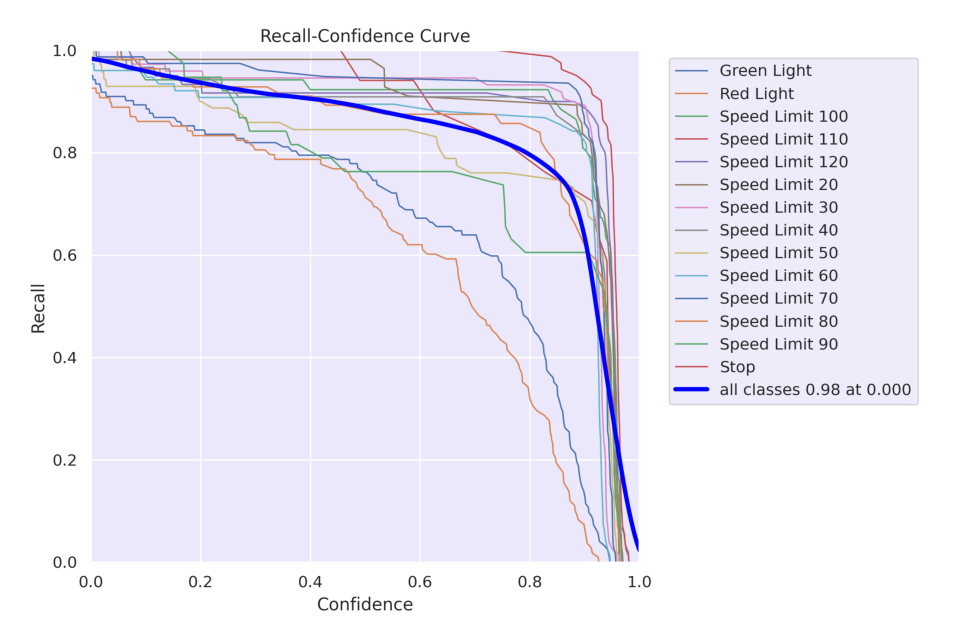

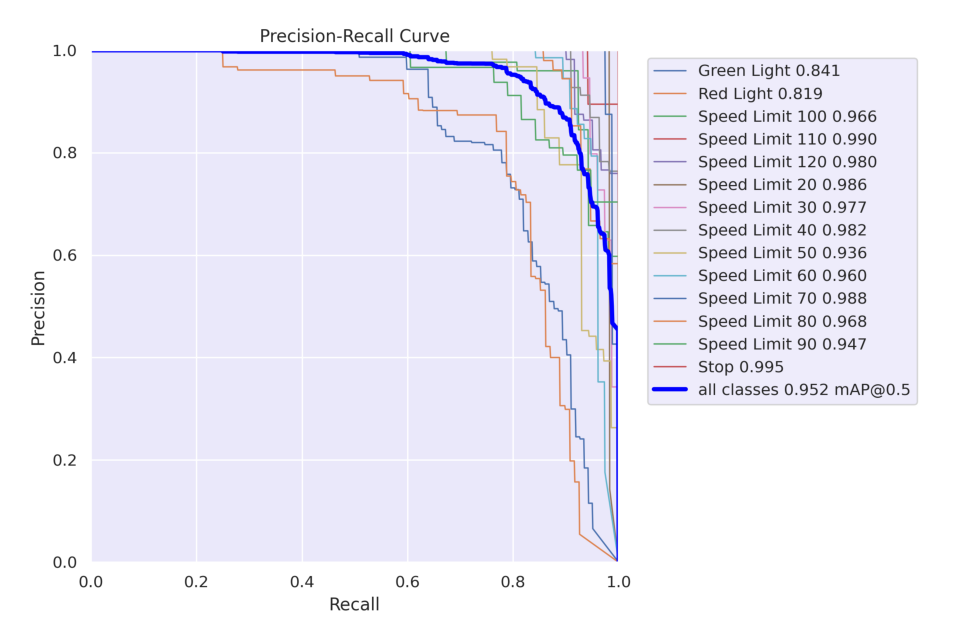

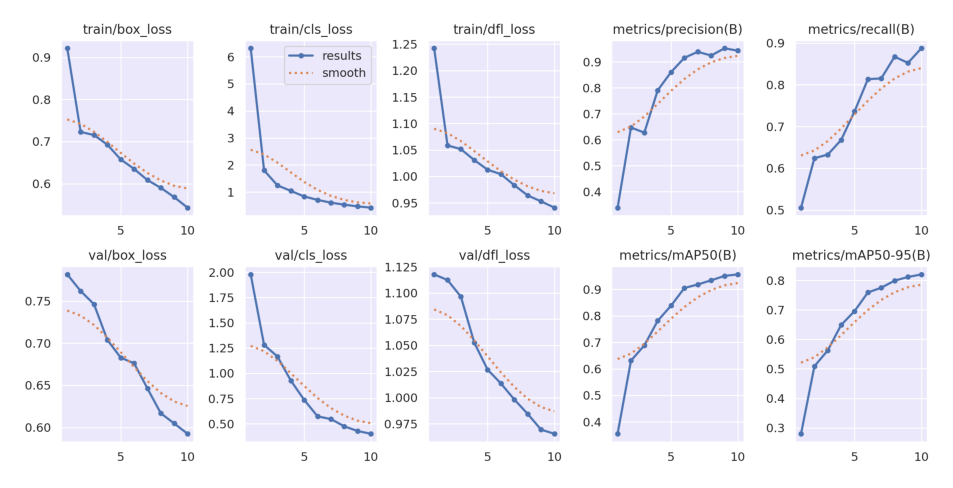

In [12]:
import os
import cv2
import matplotlib.pyplot as plt

def display_images(post_training_files_path, image_files):

    for image_file in image_files:
        image_path = os.path.join(post_training_files_path, image_file)
        img = cv2.imread(image_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        plt.figure(figsize=(10, 10), dpi=120)
        plt.imshow(img)
        plt.axis('off')
        plt.show()

# List of image files to display
image_files = [
    'confusion_matrix_normalized.png',
    'F1_curve.png',
    'P_curve.png',
    'R_curve.png',
    'PR_curve.png',
    'results.png'
]

# Path to the directory containing the images
post_training_files_path = '/content/runs/detect/train'

# Display the images
display_images(post_training_files_path, image_files)

In [13]:
Result_Final_model = pd.read_csv('/content/runs/detect/train/results.csv')
Result_Final_model.tail(30)


,epoch,time,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
0,1,78.4266,0.92148,6.31228,1.24210,0.33873,0.50557,0.35484,0.27977,0.78169,1.97856,1.11787,0.000174,0.000174,0.000174
1,2,151.5260,0.72285,1.80030,1.05851,0.64716,0.62409,0.63112,0.50864,0.76192,1.28039,1.11246,0.000315,0.000315,0.000315
2,3,223.6600,0.71539,1.24617,1.05155,0.62760,0.63278,0.68853,0.56257,0.74624,1.16630,1.09658,0.000421,0.000421,0.000421
3,4,296.3940,0.69251,1.04326,1.03081,0.79036,0.66768,0.78146,0.64868,0.70387,0.92769,1.05257,0.000370,0.000370,0.000370
4,5,368.6250,0.65749,0.83621,1.01266,0.86049,0.73598,0.83875,0.69538,0.68277,0.73694,1.02676,0.000318,0.000318,0.000318
5,6,440.3150,0.63494,0.70947,1.00410,0.91573,0.81343,0.90537,0.75875,0.67611,0.57388,1.01344,0.000266,0.000266,0.000266
6,7,512.5000,0.60842,0.60816,0.98326,0.93848,0.81523,0.91858,0.77491,0.64614,0.54664,0.99814,0.000214,0.000214,0.000214
7,8,584.5990,0.58998,0.53301,0.96398,0.92429,0.86736,0.93438,0.79893,0.61674,0.47522,0.98438,0.000161,0.000161,0.000161
8,9,657.0700,0.56792,0.46994,0.95278,0.95215,0.85239,0.95093,0.81118,0.60467,0.42831,0.96933,0.000109,0.000109,0.000109
9,10,730.0950,0.54293,0.42253,0.94092,0.94286,0.88746,0.95670,0.82007,0.59242,0.40130,0.96540,0.000057,0.000057,0.000057


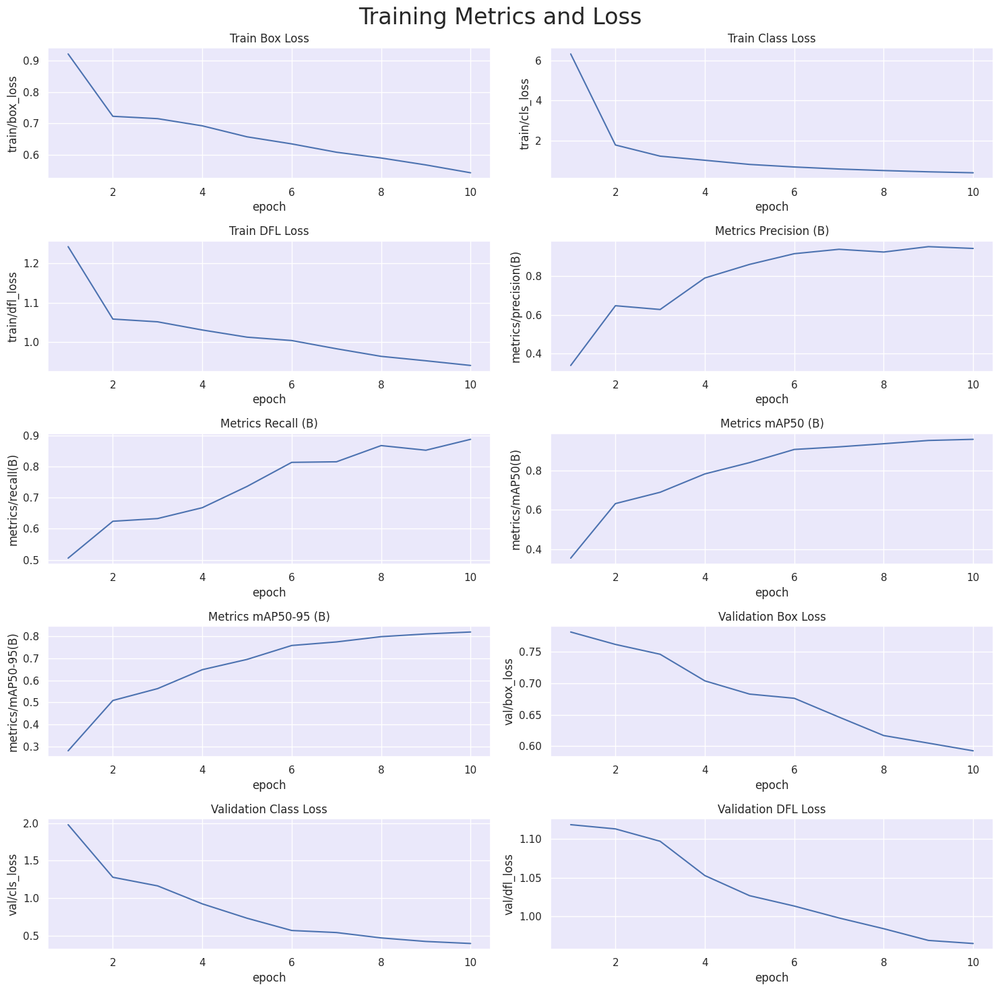

In [14]:
# Read the results.csv file as a pandas dataframe
Result_Final_model.columns = Result_Final_model.columns.str.strip()

# Create subplots
fig, axs = plt.subplots(nrows=5, ncols=2, figsize=(15, 15))

# Plot the columns using seaborn
sns.lineplot(x='epoch', y='train/box_loss', data=Result_Final_model, ax=axs[0,0])
sns.lineplot(x='epoch', y='train/cls_loss', data=Result_Final_model, ax=axs[0,1])
sns.lineplot(x='epoch', y='train/dfl_loss', data=Result_Final_model, ax=axs[1,0])
sns.lineplot(x='epoch', y='metrics/precision(B)', data=Result_Final_model, ax=axs[1,1])
sns.lineplot(x='epoch', y='metrics/recall(B)', data=Result_Final_model, ax=axs[2,0])
sns.lineplot(x='epoch', y='metrics/mAP50(B)', data=Result_Final_model, ax=axs[2,1])
sns.lineplot(x='epoch', y='metrics/mAP50-95(B)', data=Result_Final_model, ax=axs[3,0])
sns.lineplot(x='epoch', y='val/box_loss', data=Result_Final_model, ax=axs[3,1])
sns.lineplot(x='epoch', y='val/cls_loss', data=Result_Final_model, ax=axs[4,0])
sns.lineplot(x='epoch', y='val/dfl_loss', data=Result_Final_model, ax=axs[4,1])

# Set titles and axis labels for each subplot
axs[0,0].set(title='Train Box Loss')
axs[0,1].set(title='Train Class Loss')
axs[1,0].set(title='Train DFL Loss')
axs[1,1].set(title='Metrics Precision (B)')
axs[2,0].set(title='Metrics Recall (B)')
axs[2,1].set(title='Metrics mAP50 (B)')
axs[3,0].set(title='Metrics mAP50-95 (B)')
axs[3,1].set(title='Validation Box Loss')
axs[4,0].set(title='Validation Class Loss')
axs[4,1].set(title='Validation DFL Loss')


plt.suptitle('Training Metrics and Loss', fontsize=24)
plt.subplots_adjust(top=0.8)
plt.tight_layout()
plt.show()

# Validation results

In [15]:
# Loading the best performing model
Valid_model = YOLO('/content/runs/detect/train/weights/best.pt')

# Evaluating the model on the validset
metrics = Valid_model.val(split = 'val')

# final results
print("precision(B): ", metrics.results_dict["metrics/precision(B)"])
print("metrics/recall(B): ", metrics.results_dict["metrics/recall(B)"])
print("metrics/mAP50(B): ", metrics.results_dict["metrics/mAP50(B)"])
print("metrics/mAP50-95(B): ", metrics.results_dict["metrics/mAP50-95(B)"])

Ultralytics 8.3.141 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 11,131,389 parameters, 0 gradients, 28.5 GFLOPs
val: Fast image access ✅ (ping: 0.2±0.2 ms, read: 34.2±17.7 MB/s, size: 11.2 KB)


val: Scanning /kaggle/input/cardetection/car/valid/labels... 801 images, 0 backgrounds, 0 corrupt: 100%|██████████| 801/801 [00:01<00:00, 430.23it/s]

WARNING ⚠️ val: Cache directory /kaggle/input/cardetection/car/valid is not writeable, cache not saved.



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:13<00:00,  3.65it/s]


                   all        801        944      0.943      0.888      0.957      0.821
           Green Light         87        122      0.838      0.738      0.849      0.518
             Red Light         74        108      0.881      0.685      0.827      0.495
       Speed Limit 100         52         52      0.895      0.923      0.971      0.872
       Speed Limit 110         17         17      0.876      0.941      0.977      0.894
       Speed Limit 120         60         60      0.988      0.917      0.989      0.905
        Speed Limit 20         56         56      0.982      0.967      0.985      0.842
        Speed Limit 30         71         74       0.96      0.946      0.977      0.902
        Speed Limit 40         53         55          1      0.921      0.991      0.881
        Speed Limit 50         68         71      0.961      0.873      0.953      0.849
        Speed Limit 60         76         76      0.959      0.916      0.954      0.862
        Speed Limit 7

# Test results


0: 640x640 1 Speed Limit 50, 1 Speed Limit 80, 16.3ms
Speed: 6.3ms preprocess, 16.3ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Red Light, 16.4ms
Speed: 3.6ms preprocess, 16.4ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Speed Limit 120, 16.3ms
Speed: 2.6ms preprocess, 16.3ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Speed Limit 40, 16.4ms
Speed: 2.8ms preprocess, 16.4ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Speed Limit 120, 16.3ms
Speed: 2.5ms preprocess, 16.3ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Speed Limit 120, 16.3ms
Speed: 2.8ms preprocess, 16.3ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Stop, 16.4ms
Speed: 6.0ms preprocess, 16.4ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Speed Limit 80, 16.4ms
Speed: 5.0ms prepro

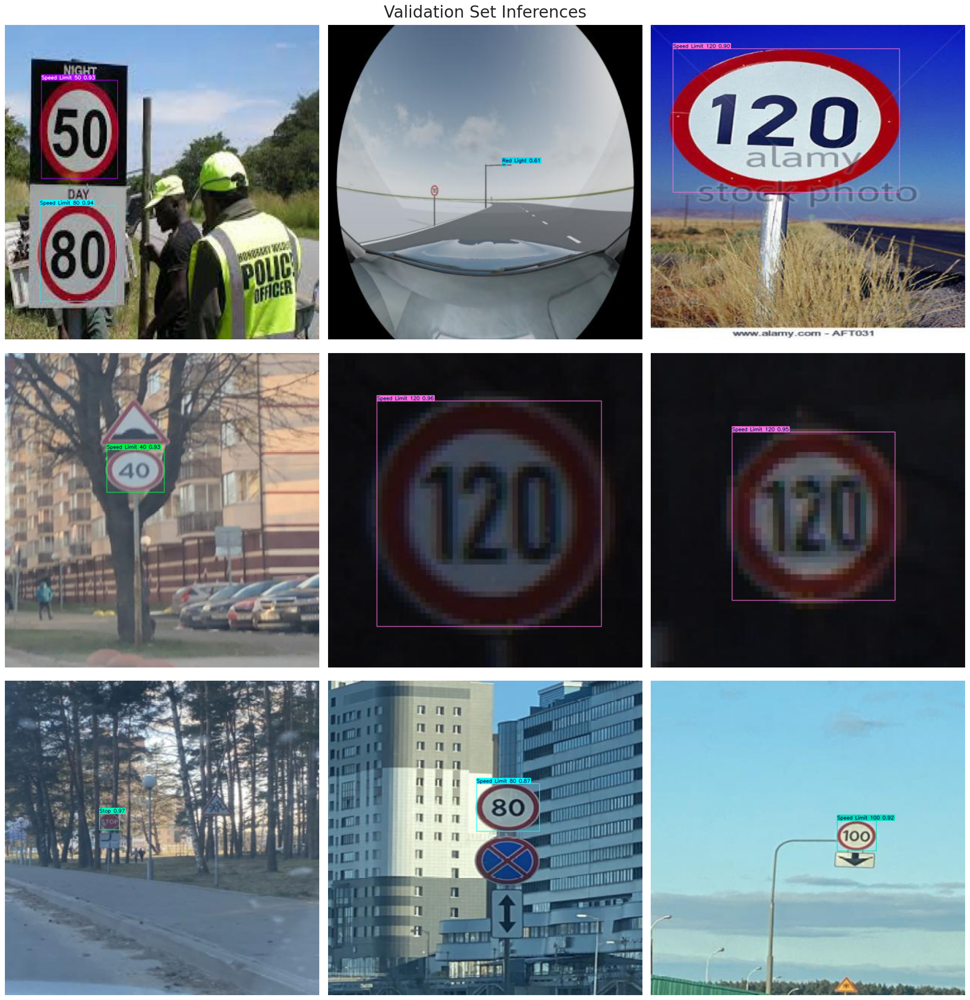

In [16]:
# Normalization function
def normalize_image(image):
    return image / 255.0

# Image resizing function
def resize_image(image, size=(640, 640)):
    return cv2.resize(image, size)

# Path to validation images
dataset_path = '/kaggle/input/cardetection/car'  # Place your dataset path here
valid_images_path = os.path.join(dataset_path, 'test', 'images')

# List of all jpg images in the directory
image_files = [file for file in os.listdir(valid_images_path) if file.endswith('.jpg')]

# Check if there are images in the directory
if len(image_files) > 0:
    # Select 9 images at equal intervals
    num_images = len(image_files)
    step_size = max(1, num_images // 9)  # Ensure the interval is at least 1
    selected_images = [image_files[i] for i in range(0, num_images, step_size)]

    # Prepare subplots
    fig, axes = plt.subplots(3, 3, figsize=(20, 21))
    fig.suptitle('Validation Set Inferences', fontsize=24)

    for i, ax in enumerate(axes.flatten()):
        if i < len(selected_images):
            image_path = os.path.join(valid_images_path, selected_images[i])

            # Load image
            image = cv2.imread(image_path)

            # Check if the image is loaded correctly
            if image is not None:
                # Resize image
                resized_image = resize_image(image, size=(640, 640))
                # Normalize image
                normalized_image = normalize_image(resized_image)

                # Convert the normalized image to uint8 data type
                normalized_image_uint8 = (normalized_image * 255).astype(np.uint8)

                # Predict with the model
                results = Valid_model.predict(source=normalized_image_uint8, imgsz=640, conf=0.5)

                # Plot image with labels
                annotated_image = results[0].plot(line_width=1)
                annotated_image_rgb = cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB)
                ax.imshow(annotated_image_rgb)
            else:
                print(f"Failed to load image {image_path}")
        ax.axis('off')

    plt.tight_layout()
    plt.show()

Ultralytics 8.3.141 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
val: Fast image access ✅ (ping: 0.3±0.2 ms, read: 3.8±2.0 MB/s, size: 22.5 KB)


val: Scanning /kaggle/input/cardetection/car/test/labels... 638 images, 1 backgrounds, 0 corrupt: 100%|██████████| 638/638 [00:05<00:00, 123.30it/s]


WARNING ⚠️ val: Cache directory /kaggle/input/cardetection/car/test is not writeable, cache not saved.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:09<00:00,  4.10it/s]


                   all        638        770      0.882      0.835      0.889      0.761
           Green Light         77        110       0.74      0.853      0.867      0.522
             Red Light         71         94      0.731      0.745      0.738      0.458
        Speed Limit 10          2          3          1          0      0.339      0.271
       Speed Limit 100         45         46      0.914      0.913      0.959       0.84
       Speed Limit 110         21         21      0.894      0.807      0.894      0.796
       Speed Limit 120         40         44      0.906      0.977      0.966      0.857
        Speed Limit 20         46         46      0.935      0.957      0.973      0.875
        Speed Limit 30         60         60      0.812       0.85      0.939      0.853
        Speed Limit 40         51         53      0.976      0.962      0.973      0.866
        Speed Limit 50         47         50      0.778       0.92      0.911      0.823
        Speed Limit 6

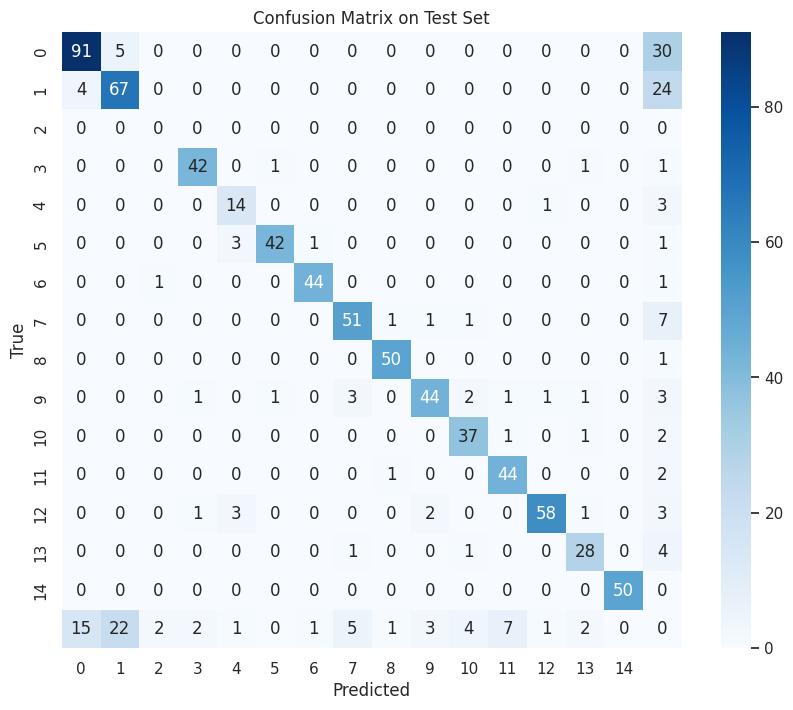

Per-Class Detection Metrics on Test Set:
Class '0': Precision=0.8273, Recall=0.7222, Accuracy=0.9366
Class '1': Precision=0.7128, Recall=0.7053, Accuracy=0.9354
Class '2': Precision=0.0000, Recall=0.0000, Accuracy=0.9965
Class '3': Precision=0.9130, Recall=0.9333, Accuracy=0.9918
Class '4': Precision=0.6667, Recall=0.7778, Accuracy=0.9871
Class '5': Precision=0.9545, Recall=0.8936, Accuracy=0.9918
Class '6': Precision=0.9565, Recall=0.9565, Accuracy=0.9953
Class '7': Precision=0.8500, Recall=0.8361, Accuracy=0.9777
Class '8': Precision=0.9434, Recall=0.9804, Accuracy=0.9953
Class '9': Precision=0.8800, Recall=0.7719, Accuracy=0.9777
Class '10': Precision=0.8222, Recall=0.9024, Accuracy=0.9859
Class '11': Precision=0.8302, Recall=0.9362, Accuracy=0.9859
Class '12': Precision=0.9508, Recall=0.8529, Accuracy=0.9847
Class '13': Precision=0.8235, Recall=0.8235, Accuracy=0.9859
Class '14': Precision=1.0000, Recall=1.0000, Accuracy=1.0000

Overall metrics:
Precision (B): 0.8816202514387032
Re

In [17]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Evaluate the model on the test set (make sure your model is loaded)
metrics = Valid_model.val(split='test')

# Extract confusion matrix
conf_matrix = metrics.confusion_matrix.matrix  # shape: (num_classes, num_classes)
class_names = metrics.names

# Show confusion matrix heatmap
plt.figure(figsize=(10,8))
sns.heatmap(conf_matrix, annot=True, cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix on Test Set')
plt.show()

# Calculate per-class metrics from confusion matrix
# Confusion matrix: rows = true class, columns = predicted class
TP = np.diag(conf_matrix)
FP = np.sum(conf_matrix, axis=0) - TP
FN = np.sum(conf_matrix, axis=1) - TP
TN = np.sum(conf_matrix) - (TP + FP + FN)

precision = TP / (TP + FP + 1e-10)
recall = TP / (TP + FN + 1e-10)
accuracy = (TP + TN) / (TP + TN + FP + FN + 1e-10)

print("Per-Class Detection Metrics on Test Set:")
for i, cname in enumerate(class_names):
    print(f"Class '{cname}': Precision={precision[i]:.4f}, Recall={recall[i]:.4f}, Accuracy={accuracy[i]:.4f}")

# Also print the overall precision, recall, mAP etc from metrics.results_dict if you want
print("\nOverall metrics:")
print(f"Precision (B): {metrics.results_dict.get('metrics/precision(B)', 'N/A')}")
print(f"Recall (B): {metrics.results_dict.get('metrics/recall(B)', 'N/A')}")
print(f"mAP50 (B): {metrics.results_dict.get('metrics/mAP50(B)', 'N/A')}")
print(f"mAP50-95 (B): {metrics.results_dict.get('metrics/mAP50-95(B)', 'N/A')}")


# Video detection

In [18]:
# Convert mp4
!ffmpeg -y -loglevel panic -i /kaggle/input/cardetection/video.mp4 output.mp4


# Display the video
Video("output.mp4", width=960, embed=True)

In [63]:
import cv2

cap = cv2.VideoCapture("/kaggle/input/cardetection/video.mp4")
fps = cap.get(cv2.CAP_PROP_FPS)
cap.release()

print("Video FPS:", fps)


Video FPS: 30.0


In [19]:
results_generator=Valid_model.predict(source="/kaggle/input/cardetection/video.mp4", show=False,save = True, stream=True  )
for r in results_generator:
    pass


video 1/1 (frame 1/508) /kaggle/input/cardetection/video.mp4: 640x640 1 Stop, 17.4ms
video 1/1 (frame 2/508) /kaggle/input/cardetection/video.mp4: 640x640 1 Stop, 16.3ms
video 1/1 (frame 3/508) /kaggle/input/cardetection/video.mp4: 640x640 1 Stop, 16.3ms
video 1/1 (frame 4/508) /kaggle/input/cardetection/video.mp4: 640x640 (no detections), 16.3ms
video 1/1 (frame 5/508) /kaggle/input/cardetection/video.mp4: 640x640 1 Stop, 16.2ms
video 1/1 (frame 6/508) /kaggle/input/cardetection/video.mp4: 640x640 1 Stop, 16.3ms
video 1/1 (frame 7/508) /kaggle/input/cardetection/video.mp4: 640x640 (no detections), 16.2ms
video 1/1 (frame 8/508) /kaggle/input/cardetection/video.mp4: 640x640 1 Stop, 16.3ms
video 1/1 (frame 9/508) /kaggle/input/cardetection/video.mp4: 640x640 1 Stop, 16.2ms
video 1/1 (frame 10/508) /kaggle/input/cardetection/video.mp4: 640x640 (no detections), 16.2ms
video 1/1 (frame 11/508) /kaggle/input/cardetection/video.mp4: 640x640 1 Stop, 16.2ms
video 1/1 (frame 12/508) /kaggle/in

In [20]:
# show result
# Convert format
!ffmpeg -y -loglevel panic -i /content/runs/detect/predict/video.avi result_out.mp4

# Display the video
Video("result_out.mp4", width=960, embed=True)

In [21]:
# Export the model
Valid_model.export(format='onnx')

Ultralytics 8.3.141 🚀 Python-3.11.12 torch-2.6.0+cu124 CPU (Intel Xeon 2.20GHz)
💡 ProTip: Export to OpenVINO format for best performance on Intel CPUs. Learn more at https://docs.ultralytics.com/integrations/openvino/

PyTorch: starting from '/content/runs/detect/train/weights/best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 19, 8400) (21.5 MB)
requirements: Ultralytics requirements ['onnx>=1.12.0,<1.18.0', 'onnxslim>=0.1.53', 'onnxruntime-gpu'] not found, attempting AutoUpdate...

requirements: AutoUpdate success ✅ 13.9s
WARNING ⚠️ requirements: Restart runtime or rerun command for updates to take effect


ONNX: starting export with onnx 1.17.0 opset 19...
ONNX: slimming with onnxslim 0.1.53...
ONNX: export success ✅ 16.0s, saved as '/content/runs/detect/train/weights/best.onnx' (42.7 MB)

Export complete (17.0s)
Results saved to /content/runs/detect/train/weights
Predict:         yolo predict task=detect model=/content/runs/detect/train/weights/best.onnx imgsz=

'/content/runs/detect/train/weights/best.onnx'

# Bonus: stop sign tshirt

In [22]:
!pip install ultralytics opencv-python


In [23]:
!pip install ultralytics opencv-python deep_sort_realtime


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.4/8.4 MB 49.8 MB/s eta 0:00:00



0: 640x544 1 Stop, 17.5ms
Speed: 3.3ms preprocess, 17.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 544)

0: 640x544 2 persons, 5 cars, 1 stop sign, 16.9ms
Speed: 14.3ms preprocess, 16.9ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 544)
Results for: /content/pic.png


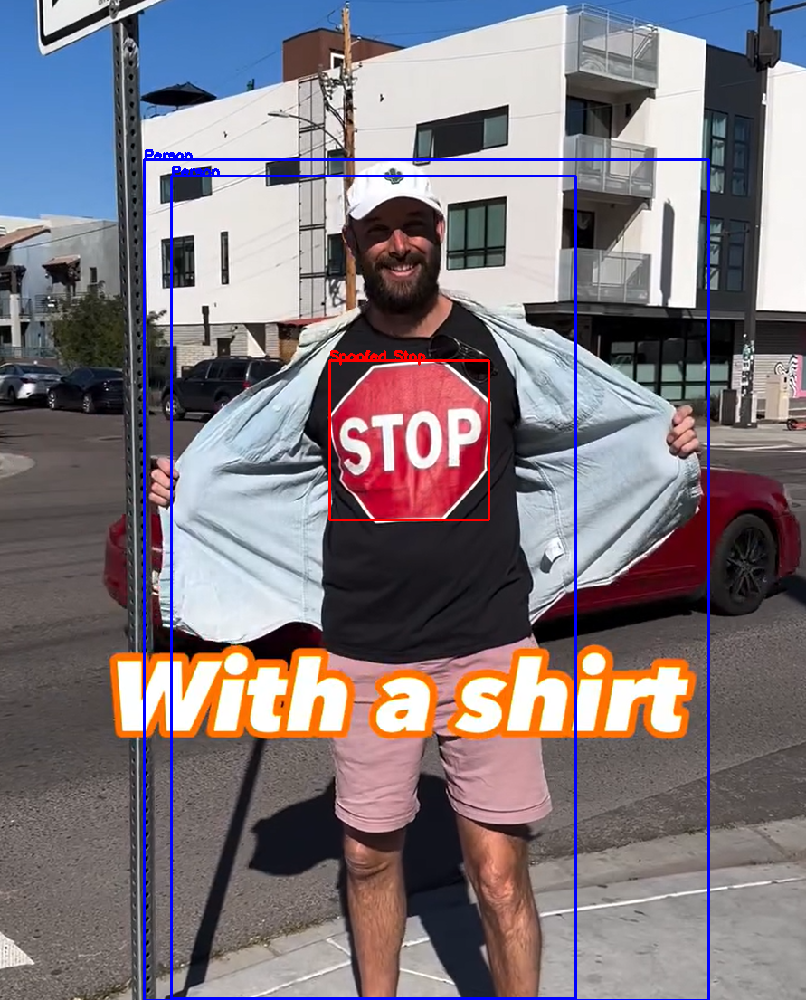


0: 640x480 1 Green Light, 1 Stop, 24.6ms
Speed: 3.5ms preprocess, 24.6ms inference, 11.1ms postprocess per image at shape (1, 3, 640, 480)

0: 640x480 1 person, 3 cars, 2 traffic lights, 1 stop sign, 36.8ms
Speed: 7.3ms preprocess, 36.8ms inference, 9.4ms postprocess per image at shape (1, 3, 640, 480)
Results for: /content/picCV6.png


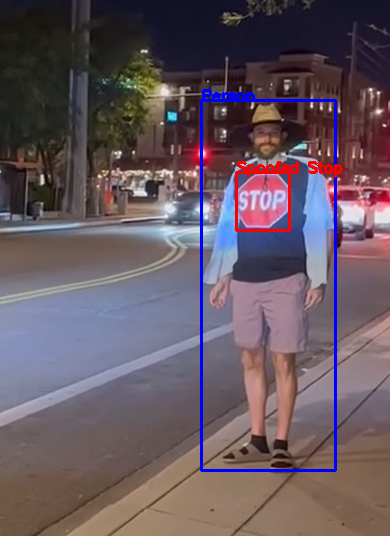


0: 640x544 1 Stop, 23.0ms
Speed: 4.1ms preprocess, 23.0ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 544)

0: 640x544 2 persons, 6 cars, 16.2ms
Speed: 3.7ms preprocess, 16.2ms inference, 3.4ms postprocess per image at shape (1, 3, 640, 544)
Results for: /content/picCV7.png


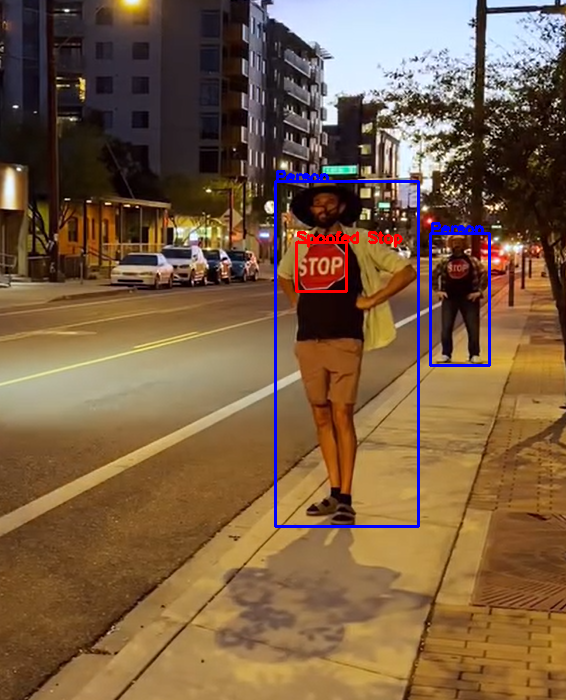

In [61]:
import cv2
from ultralytics import YOLO
from google.colab.patches import cv2_imshow
import numpy as np

# Load custom model for traffic signs
traffic_model = YOLO('/content/runs/detect/train/weights/best.pt')

# Load COCO model for person detection
person_model = YOLO('yolov8n.pt')  # Use yolov8s.pt/yolov8m.pt for better accuracy if needed

# ---------- IoU function ----------
def iou(boxA, boxB):
    xA = max(boxA[0], boxB[0])
    yA = max(boxA[1], boxB[1])
    xB = min(boxA[2], boxB[2])
    yB = min(boxA[3], boxB[3])
    interArea = max(0, xB - xA) * max(0, yB - yA)
    boxAArea = (boxA[2] - boxA[0]) * (boxA[3] - boxA[1])
    boxBArea = (boxB[2] - boxB[0]) * (boxB[3] - boxB[1])
    return interArea / float(boxAArea + boxBArea - interArea)

# ---------- Process multiple images ----------
image_paths = ['/content/pic.png', '/content/picCV6.png', '/content/picCV7.png']  # Add as many paths as you want

for image_path in image_paths:
    image = cv2.imread(image_path)

    # ---------- Detect traffic signs ----------
    traffic_results = traffic_model(image)[0]
    traffic_boxes = traffic_results.boxes.xyxy.cpu().numpy()
    traffic_classes = traffic_results.boxes.cls.cpu().numpy().astype(int)
    traffic_names = traffic_results.names

    stop_sign_boxes = []
    for box, cls in zip(traffic_boxes, traffic_classes):
        label = traffic_names[cls].lower()
        if "stop" in label:
            stop_sign_boxes.append(box)

    # ---------- Detect persons ----------
    person_results = person_model(image)[0]
    person_boxes = []
    for box, cls in zip(person_results.boxes.xyxy.cpu().numpy(), person_results.boxes.cls.cpu().numpy().astype(int)):
        if person_results.names[cls].lower() == "person":
            person_boxes.append(box)

    # ---------- Classify stop signs ----------
    filtered = []
    spoofed = []

    for stop_box in stop_sign_boxes:
        is_spoof = False
        for person_box in person_boxes:
            # Check full containment or high overlap
            if (stop_box[0] >= person_box[0] and stop_box[1] >= person_box[1] and
                stop_box[2] <= person_box[2] and stop_box[3] <= person_box[3]) or iou(stop_box, person_box) > 0.5:
                is_spoof = True
                break
        if is_spoof:
            spoofed.append(stop_box)
        else:
            filtered.append(stop_box)

    # ---------- Draw results ----------
    for box in person_boxes:
        cv2.rectangle(image, tuple(box[:2].astype(int)), tuple(box[2:].astype(int)), (255, 0, 0), 2)
        cv2.putText(image, "Person", tuple(box[:2].astype(int)), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)

    for box in filtered:
        cv2.rectangle(image, tuple(box[:2].astype(int)), tuple(box[2:].astype(int)), (0, 255, 0), 2)
        cv2.putText(image, "Stop Sign", tuple(box[:2].astype(int)), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    for box in spoofed:
        cv2.rectangle(image, tuple(box[:2].astype(int)), tuple(box[2:].astype(int)), (0, 0, 255), 2)
        cv2.putText(image, "Spoofed Stop", tuple(box[:2].astype(int)), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 255), 2)

    # ---------- Display result ----------
    print(f"Results for: {image_path}")
    cv2_imshow(image)
    cv2.waitKey(0)

cv2.destroyAllWindows()



In [ ]:
import cv2
from ultralytics import YOLO
import numpy as np

# Load models
traffic_model = YOLO('/content/runs/detect/train/weights/best.pt')
person_model = YOLO('yolov8n.pt')  # Use yolov8s.pt or yolov8m.pt for better accuracy if needed

# ---------- IoU Function ----------
def iou(boxA, boxB):
    xA = max(boxA[0], boxB[0])
    yA = max(boxA[1], boxB[1])
    xB = min(boxA[2], boxB[2])
    yB = min(boxA[3], boxB[3])
    interArea = max(0, xB - xA) * max(0, yB - yA)
    boxAArea = (boxA[2] - boxA[0]) * (boxA[3] - boxA[1])
    boxBArea = (boxB[2] - boxB[0]) * (boxB[3] - boxB[1])
    return interArea / float(boxAArea + boxBArea - interArea)

# ---------- Video Setup ----------
input_video_path = "/content/video.mp4"
output_video_path = "/content/output_video.mp4"

cap = cv2.VideoCapture(input_video_path)

# Get video properties
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
fps = cap.get(cv2.CAP_PROP_FPS)

# Define the codec and output video writer
fourcc = cv2.VideoWriter_fourcc(*'mp4v')  # or 'XVID'
out = cv2.VideoWriter(output_video_path, fourcc, fps, (width, height))

frame_count = 0

while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    frame_count += 1
    print(f"Processing frame {frame_count}")

    # Detect traffic signs
    traffic_results = traffic_model(frame)[0]
    traffic_boxes = traffic_results.boxes.xyxy.cpu().numpy()
    traffic_classes = traffic_results.boxes.cls.cpu().numpy().astype(int)
    traffic_names = traffic_results.names

    stop_sign_boxes = []
    for box, cls in zip(traffic_boxes, traffic_classes):
        label = traffic_names[cls].lower()
        if "stop" in label:
            stop_sign_boxes.append(box)

    # Detect persons
    person_results = person_model(frame)[0]
    person_boxes = []
    for box, cls in zip(person_results.boxes.xyxy.cpu().numpy(), person_results.boxes.cls.cpu().numpy().astype(int)):
        if person_results.names[cls].lower() == "person":
            person_boxes.append(box)

    # Classify stop signs
    filtered = []
    spoofed = []

    for stop_box in stop_sign_boxes:
        is_spoof = False
        for person_box in person_boxes:
            if (stop_box[0] >= person_box[0] and stop_box[1] >= person_box[1] and
                stop_box[2] <= person_box[2] and stop_box[3] <= person_box[3]) or iou(stop_box, person_box) > 0.5:
                is_spoof = True
                break
        if is_spoof:
            spoofed.append(stop_box)
        else:
            filtered.append(stop_box)

    # Draw detections
    for box in person_boxes:
        cv2.rectangle(frame, tuple(box[:2].astype(int)), tuple(box[2:].astype(int)), (255, 0, 0), 2)
        cv2.putText(frame, "Person", tuple(box[:2].astype(int)), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)

    for box in filtered:
        cv2.rectangle(frame, tuple(box[:2].astype(int)), tuple(box[2:].astype(int)), (0, 255, 0), 2)
        cv2.putText(frame, "Stop Sign", tuple(box[:2].astype(int)), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    for box in spoofed:
        cv2.rectangle(frame, tuple(box[:2].astype(int)), tuple(box[2:].astype(int)), (0, 0, 255), 2)
        cv2.putText(frame, "Spoofed Stop", tuple(box[:2].astype(int)), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 255), 2)

    # Write the annotated frame to the output video
    out.write(frame)

# Release resources
cap.release()
out.release()
cv2.destroyAllWindows()

print(f"Processing complete! Annotated video saved to: {output_video_path}")